<a href="https://colab.research.google.com/github/Ramneek-90/codespaces-jupyter/blob/main/Housing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [34]:
# Import necessary libraries for data manipulation and visualization
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

Data Preparation & **Cleaning**

In [6]:
# Check for missing values
print("Missing values:")
print(df.isnull().sum())

# Display data types
print("\nData types:")
print(df.dtypes)

# Display descriptive statistics
print("\nDescriptive statistics:")
display(df.describe())

Missing values:
longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
median_house_value    0
dtype: int64

Data types:
longitude             float64
latitude              float64
housing_median_age    float64
total_rooms           float64
total_bedrooms        float64
population            float64
households            float64
median_income         float64
median_house_value    float64
dtype: object

Descriptive statistics:


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000,17000.000000
mean,-119.562108,35.625225,28.589353,2643.664412,539.410824,1429.573941,501.221941,3.883578,207300.912353
std,2.005166,2.137340,12.586937,2179.947071,421.499452,1147.852959,384.520841,1.908157,115983.764387
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.790000,33.930000,18.000000,1462.000000,297.000000,790.000000,282.000000,2.566375,119400.000000
50%,-118.490000,34.250000,29.000000,2127.000000,434.000000,1167.000000,409.000000,3.544600,180400.000000
75%,-118.000000,37.720000,37.000000,3151.250000,648.250000,1721.000000,605.250000,4.767000,265000.000000
max,-114.310000,41.950000,52.000000,37937.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


## Problem Statement

This notebook performs an exploratory data analysis (EDA) on the California Housing dataset to understand the factors influencing housing prices and to prepare the data for potential future modeling.

## Data Preparation & Cleaning

This section focuses on loading the dataset and performing initial checks to understand its structure and identify any missing values or duplicates.

### Data Inspection

We will inspect the dataset to understand its structure, data types, and summary statistics.

### Check DataFrame Shape

Let's check the number of rows and columns in the DataFrame.

### Check for Duplicates

We will check for any duplicate rows in the dataset.

### Check for Missing Values

We will check for missing values in each column and display their counts.

### Data Types and Descriptive Statistics

We will display the data types of each column and generate descriptive statistics for the numerical columns.

## Feature Engineering

In this section, we will create a new feature that might be useful for our analysis or modeling.

## Exploratory Data Analysis (EDA) and Visualization

This section focuses on visualizing the data to understand the distributions of features, relationships between them, and their relationship with the target variable.

### Visualize the distribution of numerical features

We will create histograms or density plots for numerical columns to understand their distributions.

### Visualize the relationships between numerical features

We will use scatter plots or pair plots to explore the relationships between different numerical variables.

### Explore the relationship between features and the target variable

We will visualize how different features relate to the target variable (`median_house_value`).

### Identify and visualize correlations

We will calculate and visualize the correlation matrix to understand the linear relationships between numerical features.

## Summary:

### Data Analysis Key Findings

*   Histograms and KDE plots revealed the distributions of numerical features, highlighting potential skewness in variables like `total_rooms`, `total_bedrooms`, `population`, and `households`.
*   The pair plot showed various relationships between numerical features, including the strong correlation between `total_rooms`, `total_bedrooms`, `population`, and `households`.
*   Scatter plots of features against `median_house_value` indicated a clear positive linear relationship between `median_income` and `median_house_value`. Other features like `total_rooms` and `housing_median_age` showed less pronounced or more complex relationships with the target variable.
*   The correlation matrix confirmed the strong positive correlation between `median_income` and `median_house_value` (~0.69), and also showed high correlations among the features related to the size and number of rooms/households (`total_rooms`, `total_bedrooms`, `population`, `households`). The newly created `rooms_per_household` feature also showed a positive correlation with `median_house_value` (~0.15).

### Insights or Next Steps

*   The strong positive correlation between `median_income` and `median_house_value` suggests that income is a significant predictor of housing prices in this dataset.
*   The high correlations among the size-related features might indicate multicollinearity if we were to use all of them in a linear model, suggesting potential feature selection or dimensionality reduction steps.
*   The visualizations revealed potential outliers in some features, which might need to be addressed during data preprocessing.
*   Further analysis could involve exploring the geographical influence on housing prices using the `latitude` and `longitude` features, and building a predictive model for `median_house_value` using the insights gained from this EDA.

In [35]:
# Load the dataset into a pandas DataFrame
# Specify the file path to the training data
df = pd.read_csv('/content/sample_data/california_housing_train.csv')
# Display the first few rows of the DataFrame to verify successful loading
display(df.head())

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
0,-114.31,34.19,15.0,5612.0,1283.0,1015.0,472.0,1.4936,66900.0
1,-114.47,34.40,19.0,7650.0,1901.0,1129.0,463.0,1.8200,80100.0
2,-114.56,33.69,17.0,720.0,174.0,333.0,117.0,1.6509,85700.0
3,-114.57,33.64,14.0,1501.0,337.0,515.0,226.0,3.1917,73400.0
4,-114.57,33.57,20.0,1454.0,326.0,624.0,262.0,1.9250,65500.0


In [8]:
df.shape

(17000, 9)

In [36]:
# Check the shape of the DataFrame (number of rows and columns)
df.shape

(17000, 9)

In [ ]:
# There is no row or column duplicated

In [37]:
# Check for duplicate rows in the DataFrame
df.duplicated().sum()

np.int64(0)

In [ ]:
df.info()
# type is 'int'

In [38]:
# Check for missing values in each column of the DataFrame
df.isnull().sum()

,0
longitude,0
latitude,0
housing_median_age,0
total_rooms,0
total_bedrooms,0
population,0
households,0
median_income,0
median_house_value,0


Fituer Endineering

In [16]:
df.head(2)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
0,-114.31,34.19,15.0,5612.0,1283.0,1015.0,472.0,1.4936,66900.0
1,-114.47,34.40,19.0,7650.0,1901.0,1129.0,463.0,1.8200,80100.0


## Summary:

### Data Analysis Key Findings

* Histograms and KDE plots were generated for all numerical columns, visualizing their individual distributions.
* A pair plot was created to show the pairwise relationships between all numerical features.
* Scatter plots were generated to visualize the relationship between each numerical feature and the target variable, `median_house_value`.
* A correlation matrix was calculated and visualized as a heatmap, showing the linear relationships between numerical features with correlation values annotated.

### Insights or Next Steps

* The visualizations provide initial insights into the distributions of features and their relationships with each other and the target variable, which can inform feature selection and engineering.
* Further analysis could involve exploring categorical features and their relationships with the target variable, as well as identifying and handling potential outliers or missing values observed in the visualizations.

## Summary:

### Data Analysis Key Findings

*   Histograms and KDE plots revealed the distributions of numerical features, highlighting potential skewness in variables like `total_rooms`, `total_bedrooms`, `population`, and `households`.
*   The pair plot showed various relationships between numerical features, including the strong correlation between `total_rooms`, `total_bedrooms`, `population`, and `households`.
*   Scatter plots of features against `median_house_value` indicated a clear positive linear relationship between `median_income` and `median_house_value`. Other features like `total_rooms` and `housing_median_age` showed less pronounced or more complex relationships with the target variable.
*   The correlation matrix confirmed the strong positive correlation between `median_income` and `median_house_value` (~0.69), and also showed high correlations among the features related to the size and number of rooms/households (`total_rooms`, `total_bedrooms`, `population`, `households`). The newly created `rooms_per_household` feature also showed a positive correlation with `median_house_value` (~0.15).

### Insights or Next Steps

*   The strong positive correlation between `median_income` and `median_house_value` suggests that income is a significant predictor of housing prices in this dataset.
*   The high correlations among the size-related features might indicate multicollinearity if we were to use all of them in a linear model, suggesting potential feature selection or dimensionality reduction steps.
*   The visualizations revealed potential outliers in some features, which might need to be addressed during data preprocessing.
*   Further analysis could involve exploring the geographical influence on housing prices using the `latitude` and `longitude` features, and building a predictive model for `median_house_value` using the insights gained from this EDA.

In [44]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Evaluate the model
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse) # Calculate RMSE by taking the square root of MSE
r2 = r2_score(y_test, y_pred)

print("Model Evaluation Metrics:")
print(f"Mean Absolute Error (MAE): {mae:.2f}")
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"R-squared (R2): {r2:.2f}")

print("\nInterpretation of Metrics:")
print(f"- MAE: The average absolute difference between the predicted and actual house values is approximately {mae:.2f}.")
print(f"- MSE: The average of the squared differences between predicted and actual values. It gives more weight to larger errors.")
print(f"- RMSE: The square root of the MSE, providing an error metric in the same units as the target variable. Our model's predictions are, on average, about {rmse:.2f} away from the actual values.")
print(f"- R-squared: Represents the proportion of the variance in the dependent variable (median house value) that is predictable from the independent variable (median income). An R-squared of {r2:.2f} means that approximately {r2*100:.2f}% of the variance in median house value can be explained by median income in this simple linear model.")

Model Evaluation Metrics:
Mean Absolute Error (MAE): 62164.20
Mean Squared Error (MSE): 6920028496.01
Root Mean Squared Error (RMSE): 83186.71
R-squared (R2): 0.50

Interpretation of Metrics:
- MAE: The average absolute difference between the predicted and actual house values is approximately 62164.20.
- MSE: The average of the squared differences between predicted and actual values. It gives more weight to larger errors.
- RMSE: The square root of the MSE, providing an error metric in the same units as the target variable. Our model's predictions are, on average, about 83186.71 away from the actual values.
- R-squared: Represents the proportion of the variance in the dependent variable (median house value) that is predictable from the independent variable (median income). An R-squared of 0.50 means that approximately 49.78% of the variance in median house value can be explained by median income in this simple linear model.


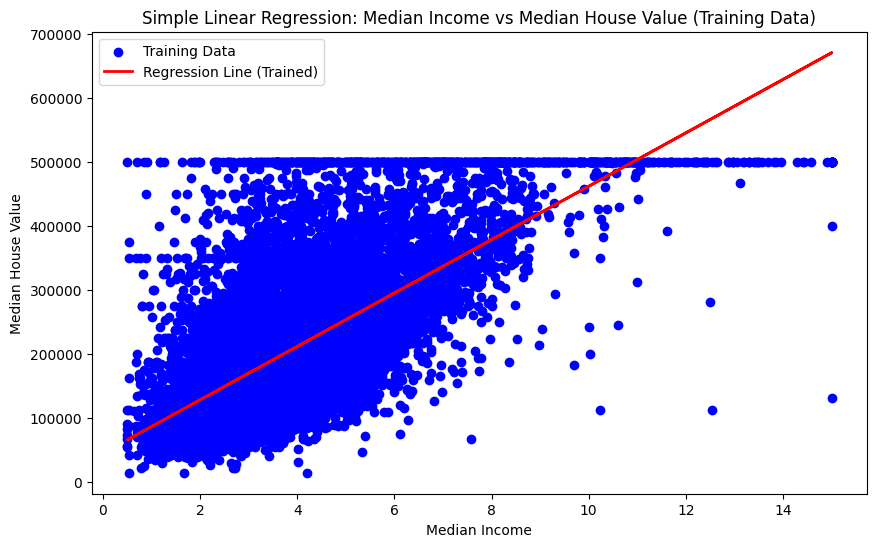

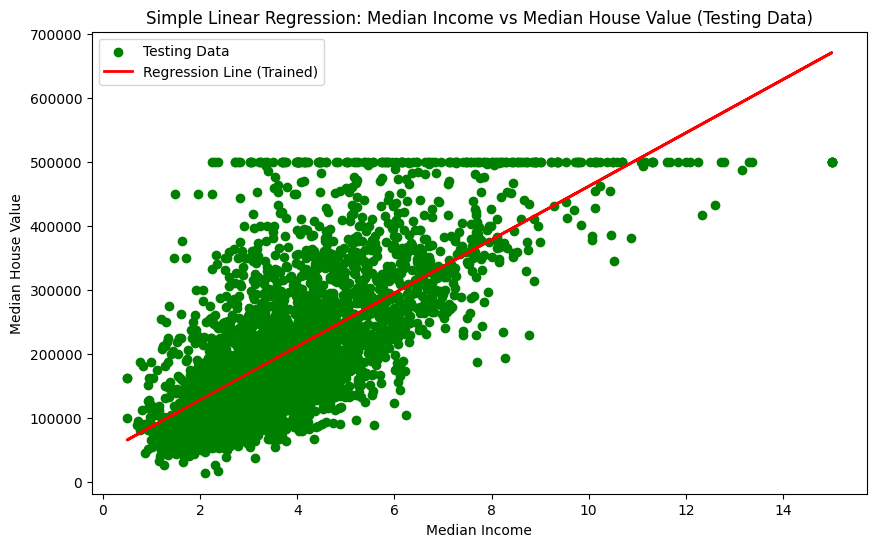

Linear Regression Model Explained:
Intercept: 45238.285506641725
Coefficient for Median Income: 41669.9355465199

Interpretation:
The intercept (45238.29) represents the predicted median house value when the median income is zero (though this might not be meaningful in a real-world context).
The coefficient for Median Income (41669.94) means that for every one unit increase in median income, the median house value is predicted to increase by approximately 41669.94 units.


In [42]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

# Select features (X) and target variable (y)
X = df[['median_income']]  # Features (independent variable) - using a double set of brackets to keep it as a DataFrame
y = df['median_house_value']  # Target variable (dependent variable)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a linear regression model
model = LinearRegression()

# Train the model using the training data
model.fit(X_train, y_train)

# Make predictions on the testing data
y_pred = model.predict(X_test)

# Visualize the training data and the regression line
plt.figure(figsize=(10, 6))
plt.scatter(X_train, y_train, color='blue', label='Training Data')
plt.plot(X_train, model.predict(X_train), color='red', linewidth=2, label='Regression Line (Trained)')
plt.xlabel('Median Income')
plt.ylabel('Median House Value')
plt.title('Simple Linear Regression: Median Income vs Median House Value (Training Data)')
plt.legend()
plt.show()

# Visualize the testing data and the regression line
plt.figure(figsize=(10, 6))
plt.scatter(X_test, y_test, color='green', label='Testing Data')
plt.plot(X_test, model.predict(X_test), color='red', linewidth=2, label='Regression Line (Trained)')
plt.xlabel('Median Income')
plt.ylabel('Median House Value')
plt.title('Simple Linear Regression: Median Income vs Median House Value (Testing Data)')
plt.legend()
plt.show()

# Explain the model
print("Linear Regression Model Explained:")
print(f"Intercept: {model.intercept_}")
print(f"Coefficient for Median Income: {model.coef_[0]}")
print("\nInterpretation:")
print(f"The intercept ({model.intercept_:.2f}) represents the predicted median house value when the median income is zero (though this might not be meaningful in a real-world context).")
print(f"The coefficient for Median Income ({model.coef_[0]:.2f}) means that for every one unit increase in median income, the median house value is predicted to increase by approximately {model.coef_[0]:.2f} units.")

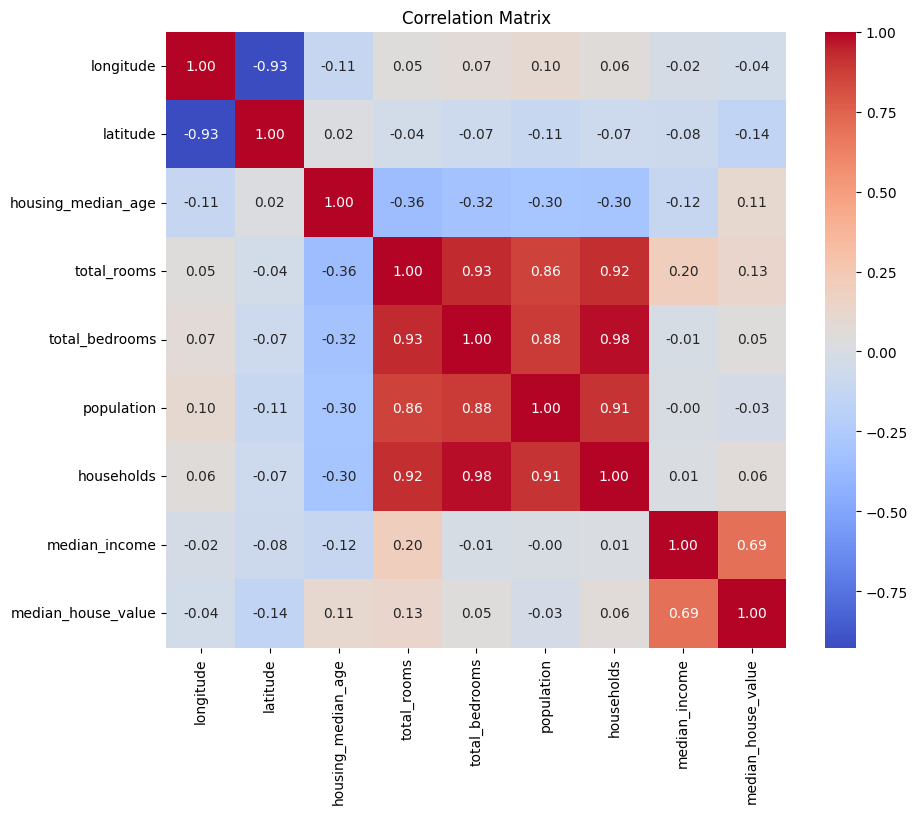

In [41]:
# Calculate the correlation matrix for all numerical columns
correlation_matrix = df.corr()
# Create a figure for the heatmap
plt.figure(figsize=(10, 8))
# Generate a heatmap of the correlation matrix
# annot=True displays the correlation values on the heatmap
# cmap='coolwarm' sets the color map
# fmt=".2f" formats the annotations to two decimal places
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
# Set the title of the heatmap
plt.title("Correlation Matrix")
# Display the heatmap
plt.show()

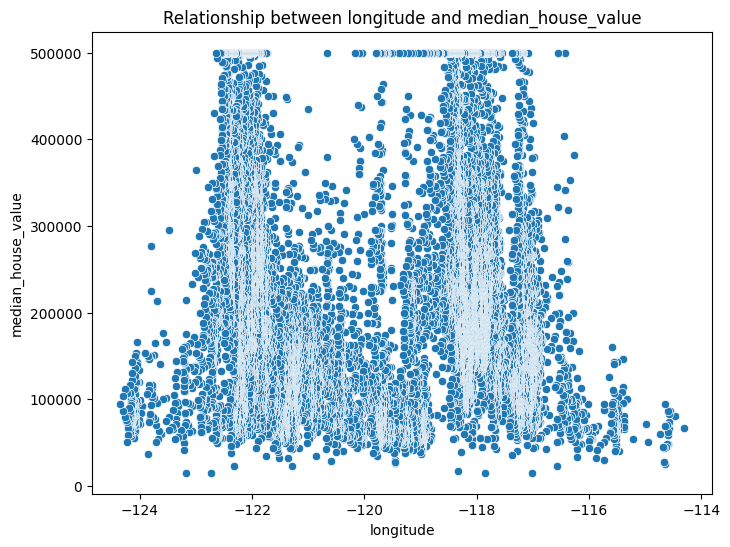

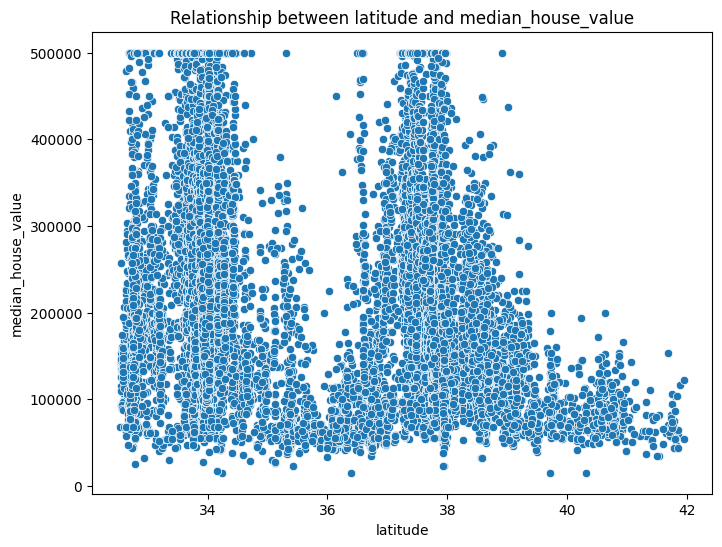

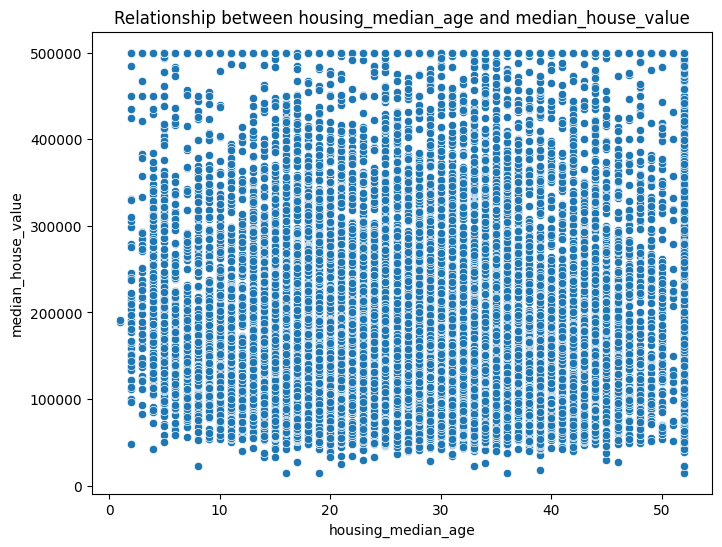

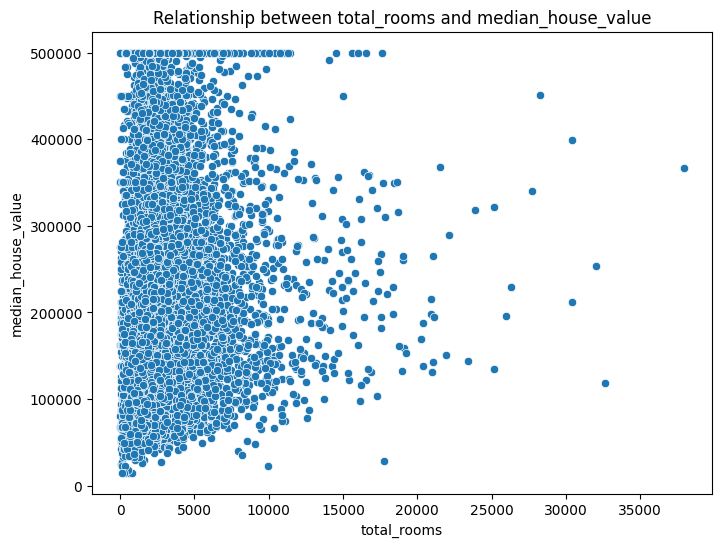

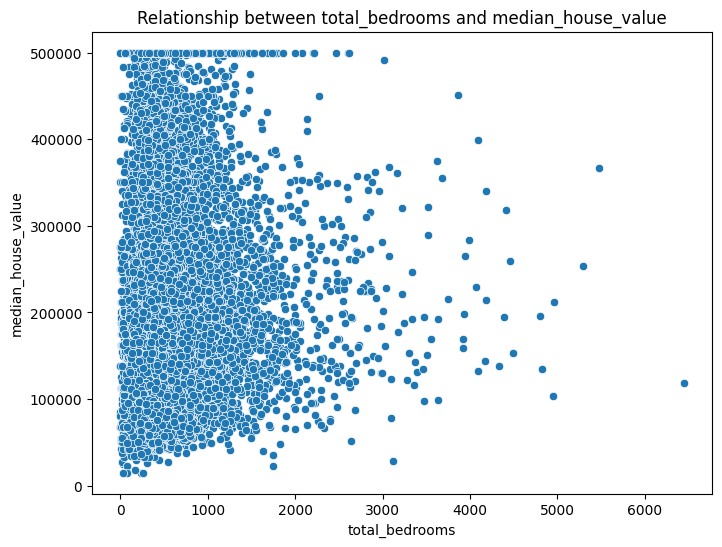

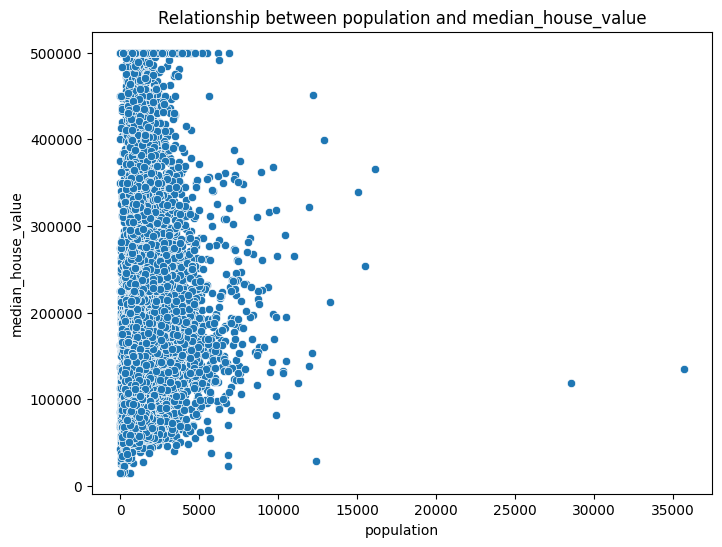

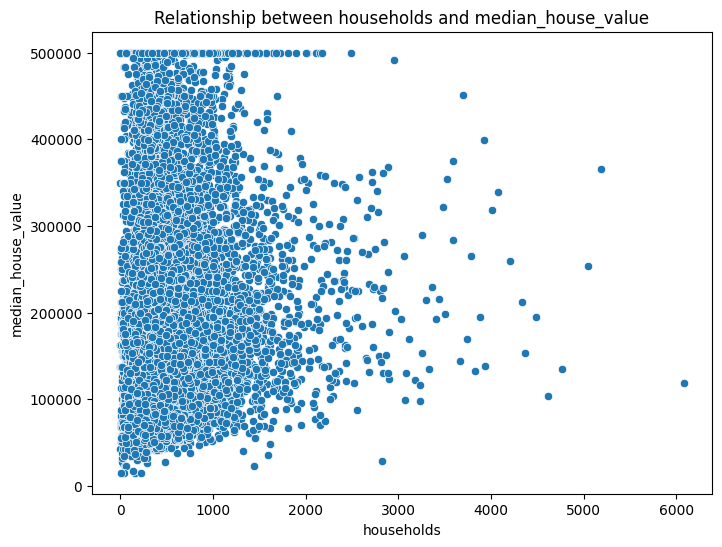

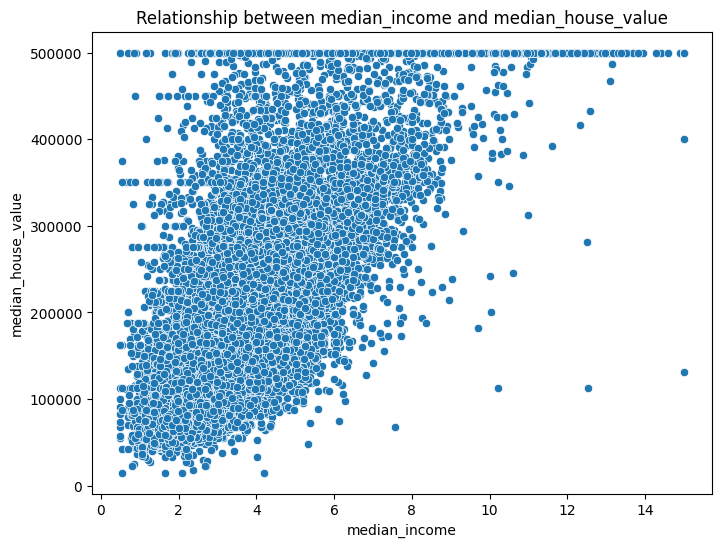

In [40]:
# Select numerical columns and define the target variable
numerical_cols = df.select_dtypes(include=np.number).columns
target_col = 'median_house_value'

# Iterate through each numerical column to create a scatter plot against the target variable
for col in numerical_cols:
    # Exclude the target column itself from plotting against itself
    if col != target_col:
        # Create a new figure for each plot
        plt.figure(figsize=(8, 6))
        # Generate a scatter plot
        sns.scatterplot(data=df, x=col, y=target_col)
        # Set the title of the plot
        plt.title(f'Relationship between {col} and {target_col}')
        # Set the label for the x-axis
        plt.xlabel(col)
        # Set the label for the y-axis
        plt.ylabel(target_col)
        # Display the plot
        plt.show()

In [22]:
df['rooms_per_household'] = df['total_rooms'] / df['households']
display(df.head())

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,rooms_per_household
0,-114.31,34.19,15.0,5612.0,1283.0,1015.0,472.0,1.4936,66900.0,11.889831
1,-114.47,34.40,19.0,7650.0,1901.0,1129.0,463.0,1.8200,80100.0,16.522678
2,-114.56,33.69,NaN,720.0,174.0,333.0,117.0,1.6509,85700.0,6.153846
3,-114.57,33.64,NaN,1501.0,337.0,515.0,226.0,3.1917,73400.0,6.641593
4,-114.57,33.57,NaN,1454.0,326.0,624.0,262.0,1.9250,65500.0,5.549618


# Task
Perform exploratory data analysis (EDA) and data visualization on the loaded dataset.

## Visualize the distribution of numerical features

### Subtask:
Create histograms or density plots for numerical columns to understand their distributions.


**Reasoning**:
Create histograms for all numerical columns in the dataframe to visualize their distributions.



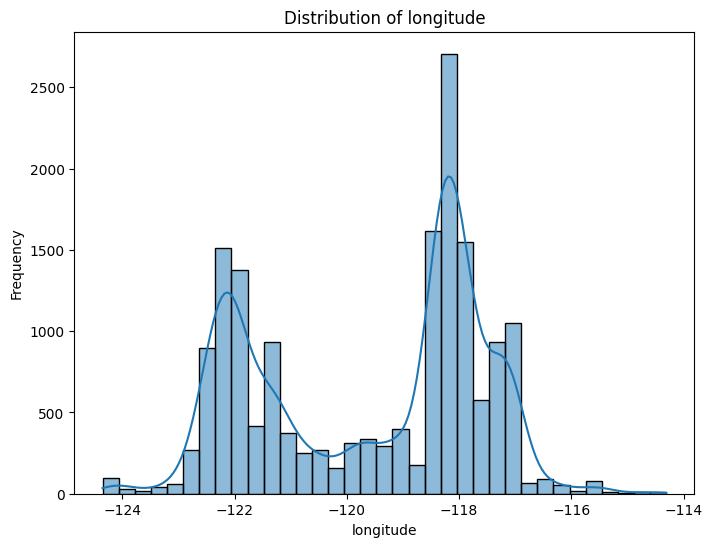

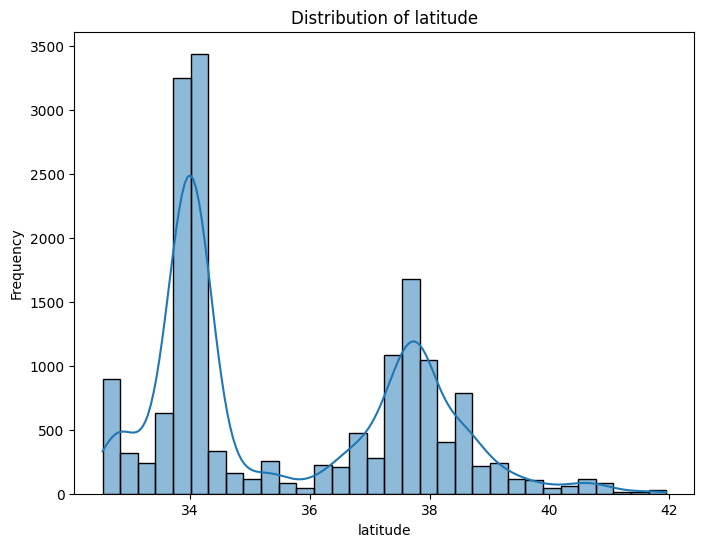

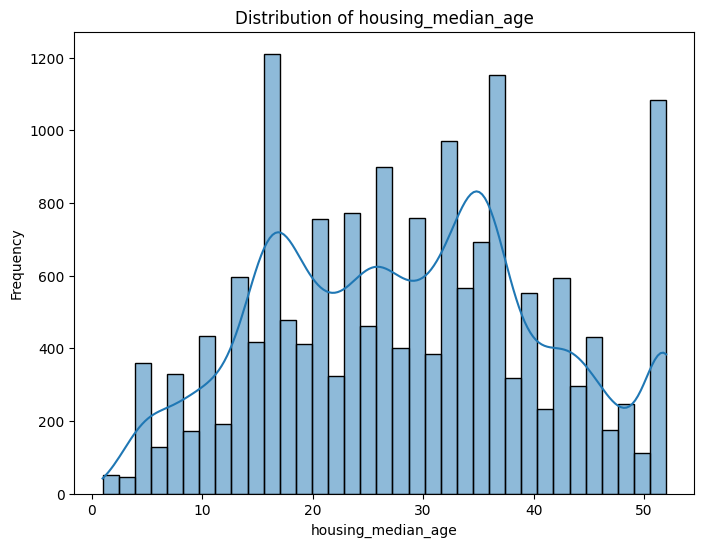

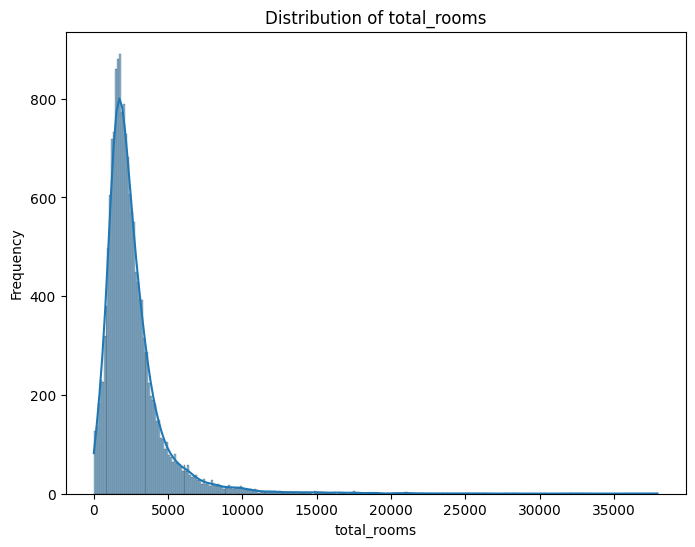

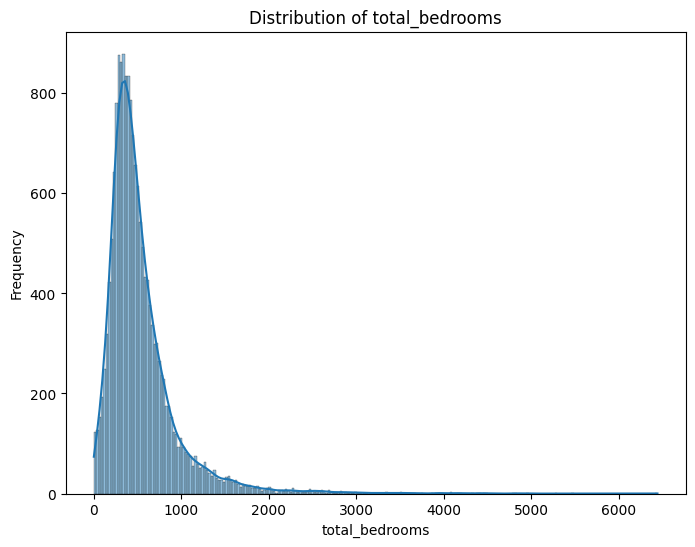

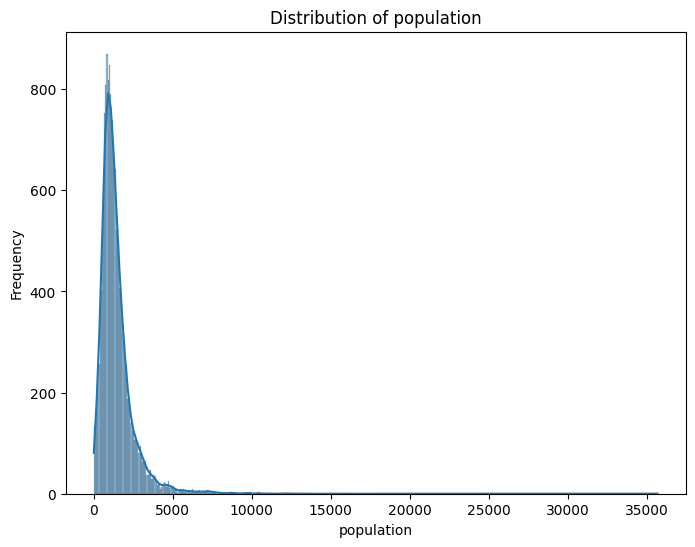

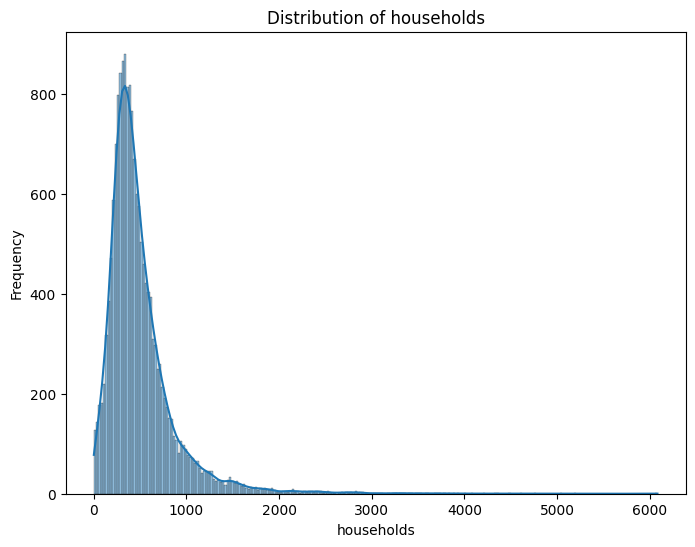

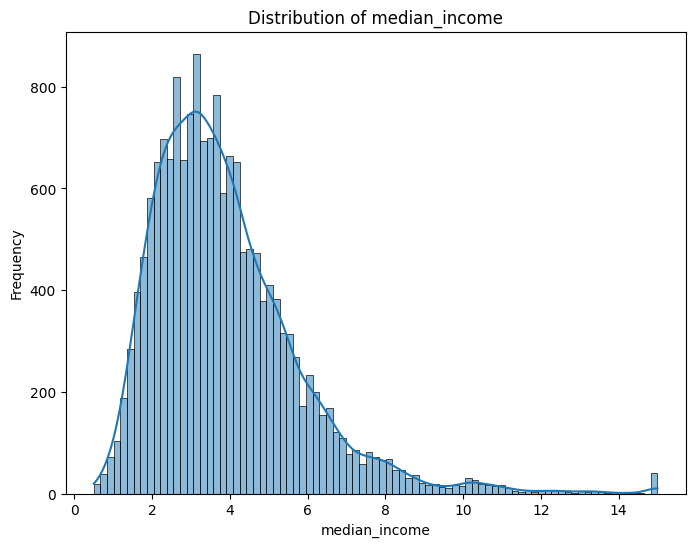

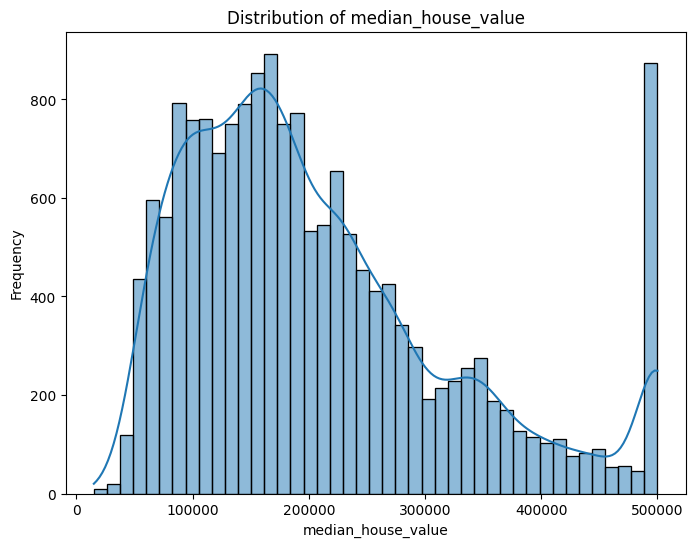

In [39]:
# Select numerical columns for visualization
numerical_cols = df.select_dtypes(include=np.number).columns

# Iterate through each numerical column to create a histogram
for col in numerical_cols:
    # Create a new figure for each plot
    plt.figure(figsize=(8, 6))
    # Generate a histogram with a Kernel Density Estimate (KDE) plot
    sns.histplot(df[col], kde=True)
    # Set the title of the plot
    plt.title(f'Distribution of {col}')
    # Set the label for the x-axis
    plt.xlabel(col)
    # Set the label for the y-axis
    plt.ylabel('Frequency')
    # Display the plot
    plt.show()

## Visualize the relationships between numerical features

### Subtask:
Use scatter plots or pair plots to explore the relationships between different numerical variables.


**Reasoning**:
Use seaborn's pairplot to visualize the relationships between all numerical variables in the dataframe.



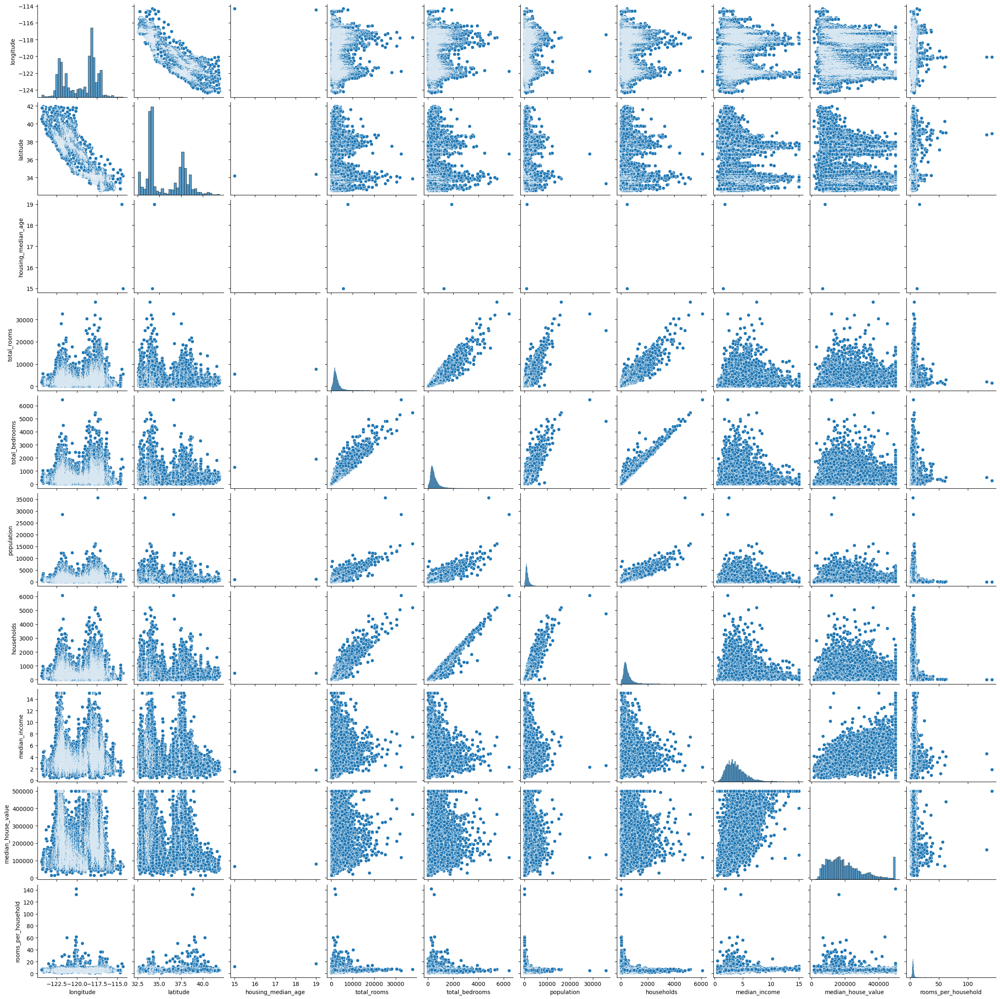

In [24]:
sns.pairplot(df)
plt.show()

## Explore the relationship between features and the target variable

### Subtask:
Visualize how different features relate to the target variable (`median_house_value`).


**Reasoning**:
Create scatter plots for each numerical feature against the target variable `median_house_value` to visualize their relationships.



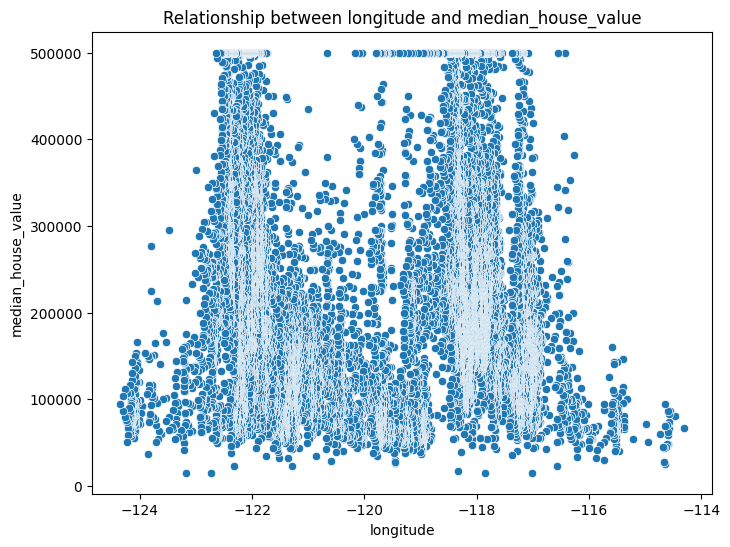

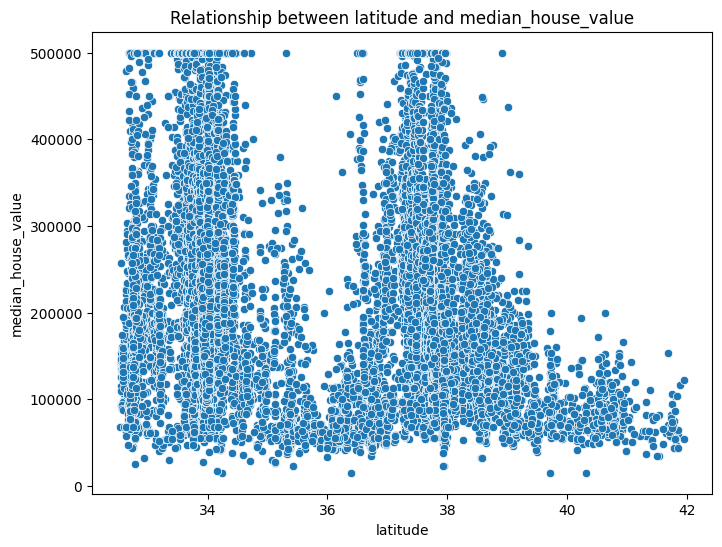

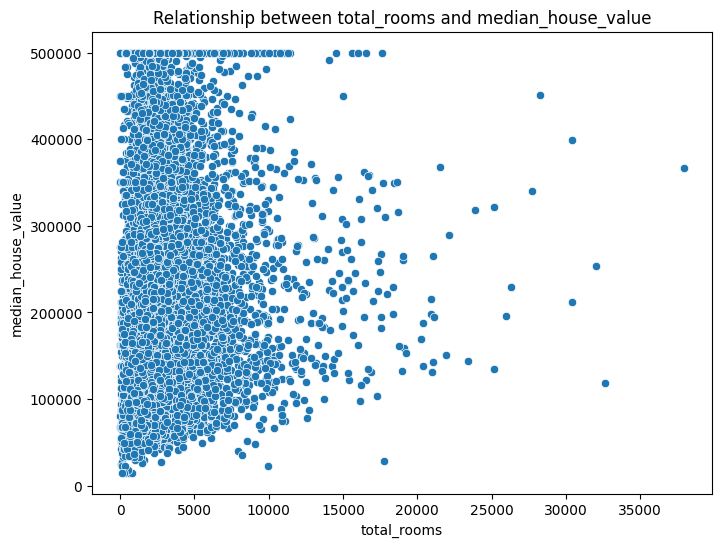

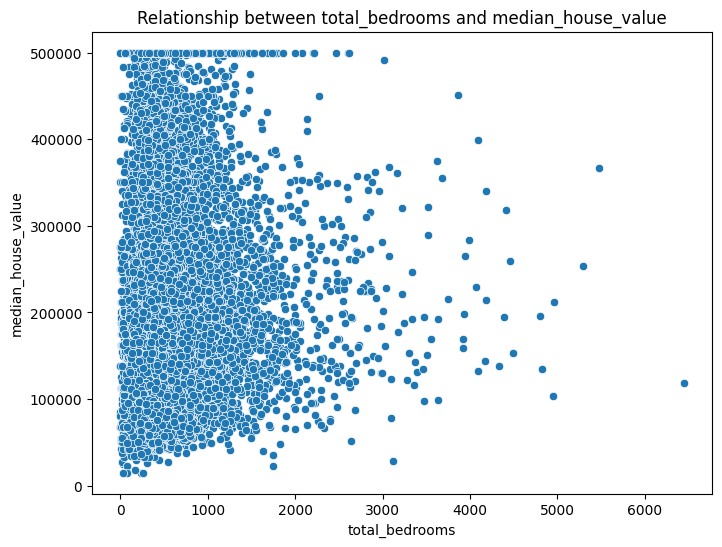

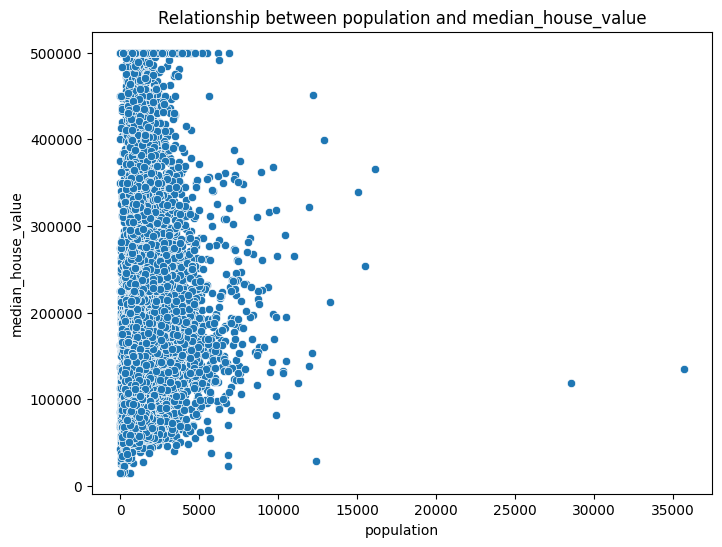

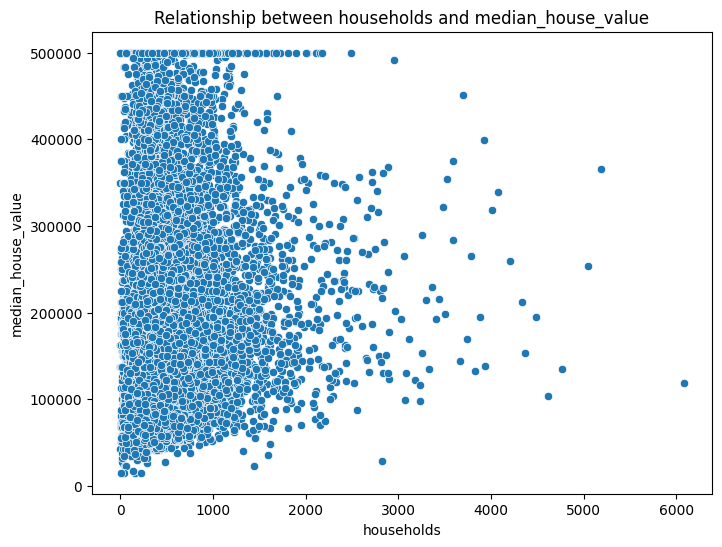

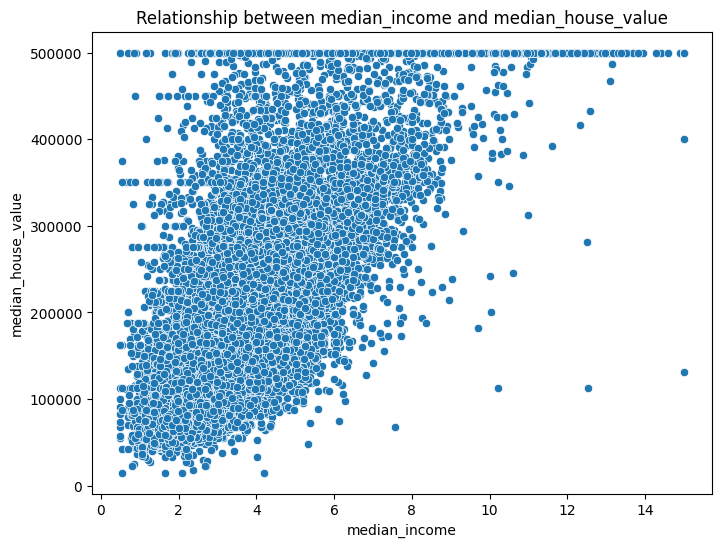

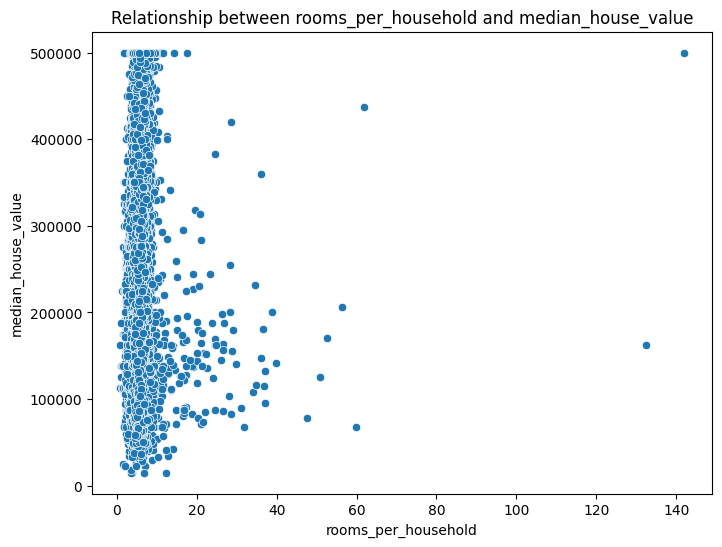

In [25]:
numerical_cols = df.select_dtypes(include=np.number).columns
target_col = 'median_house_value'

for col in numerical_cols:
    if col != target_col:
        plt.figure(figsize=(8, 6))
        sns.scatterplot(data=df, x=col, y=target_col)
        plt.title(f'Relationship between {col} and {target_col}')
        plt.xlabel(col)
        plt.ylabel(target_col)
        plt.show()

## Identify and visualize correlations

### Subtask:
Calculate and visualize the correlation matrix to understand the linear relationships between numerical features.


**Reasoning**:
Calculate and visualize the correlation matrix to understand the linear relationships between numerical features.



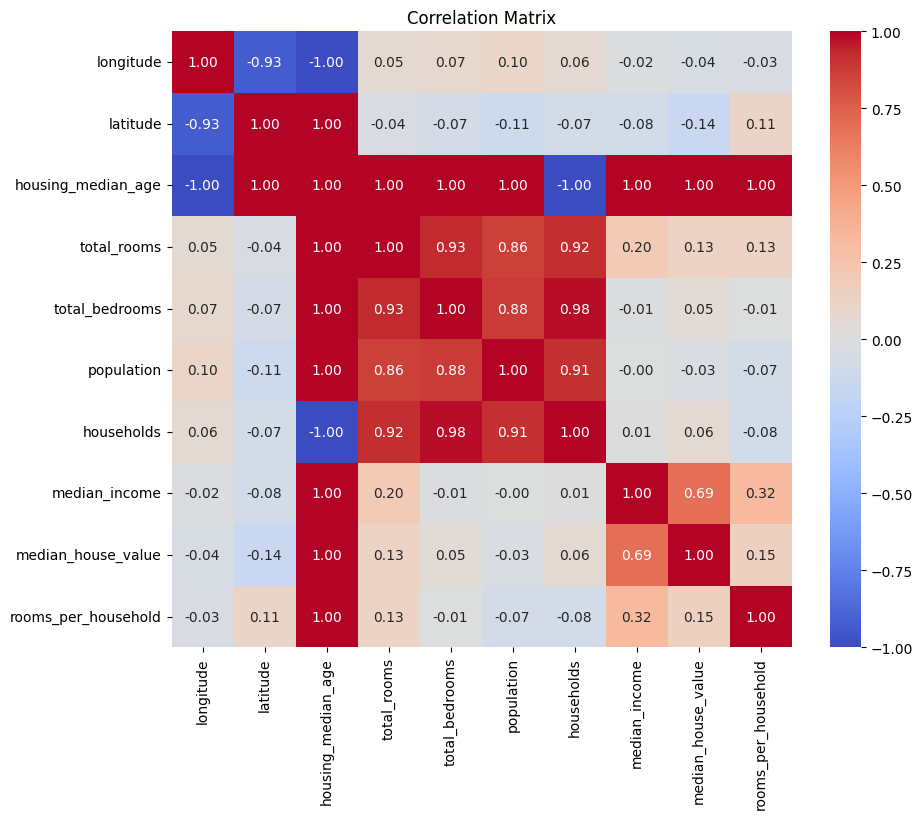

In [26]:
correlation_matrix = df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix")
plt.show()

## Summary:

### Data Analysis Key Findings

*   Histograms and KDE plots were generated for all numerical columns, visualizing their individual distributions.
*   A pair plot was created to show the pairwise relationships between all numerical features.
*   Scatter plots were generated to visualize the relationship between each numerical feature and the target variable, `median_house_value`.
*   A correlation matrix was calculated and visualized as a heatmap, showing the linear relationships between numerical features with correlation values annotated.

### Insights or Next Steps

*   The visualizations provide initial insights into the distributions of features and their relationships with each other and the target variable, which can inform feature selection and engineering.
*   Further analysis could involve exploring categorical features and their relationships with the target variable, as well as identifying and handling potential outliers or missing values observed in the visualizations.


# Task
Enhance the notebook to make it suitable for sharing on GitHub and LinkedIn by adding a problem statement, explanations for each step, code comments, refining the summary, and adding potential next steps.

## Add a problem statement/objective

### Subtask:
Add a markdown cell at the beginning of the notebook to clearly state the purpose of the analysis.


**Reasoning**:
Add a markdown cell at the beginning of the notebook to state the purpose of the analysis.



In [27]:
# This cell will be moved to the top of the notebook

## Add explanations for each step

### Subtask:
Add markdown cells before each code cell or section to explain what the code does and the reasoning behind it.


**Reasoning**:
Add a markdown cell before the first code cell to explain the purpose of importing libraries.



In [28]:
# This cell will be moved before the first code cell (cell_id: pewwOO7l0U0m)

**Reasoning**:
Add a markdown cell before the data loading code cell to explain the data loading process and the file path used.



In [29]:
# This cell will be moved before the data loading code cell (cell_id: 5cac7f37)

**Reasoning**:
Add a markdown cell before the data inspection code cells to explain their purpose.



In [30]:
# This cell will be moved before the data inspection code cell (cell_id: 42071cce)

**Reasoning**:
Add markdown cells before the duplicate checking and feature engineering code cells to explain their purposes.



In [31]:
# This cell will be moved before the duplicate checking code cell (cell_id: Ng4RC0L_28lK)
# This cell will be moved before the feature engineering code cell (cell_id: 266dd2f6)

**Reasoning**:
The previous markdown cells have been added. Now, add markdown cells before each visualization code cell to explain their purpose.



In [32]:
# This cell will be moved before the distribution visualization code cell (cell_id: 0526dcc5)
# This cell will be moved before the relationship visualization code cell (cell_id: b1de9afa)
# This cell will be moved before the target relationship visualization code cell (cell_id: 5e9c4c3d)
# This cell will be moved before the correlation matrix visualization code cell (cell_id: 777c824d)

## Add code comments

### Subtask:
Add comments within the code cells to explain specific lines or blocks of code.


**Reasoning**:
Add comments to the existing code cells to explain the purpose of each step within the code.



,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
0,-114.31,34.19,15.0,5612.0,1283.0,1015.0,472.0,1.4936,66900.0
1,-114.47,34.40,19.0,7650.0,1901.0,1129.0,463.0,1.8200,80100.0
2,-114.56,33.69,17.0,720.0,174.0,333.0,117.0,1.6509,85700.0
3,-114.57,33.64,14.0,1501.0,337.0,515.0,226.0,3.1917,73400.0
4,-114.57,33.57,20.0,1454.0,326.0,624.0,262.0,1.9250,65500.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17000 entries, 0 to 16999
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           17000 non-null  float64
 1   latitude            17000 non-null  float64
 2   housing_median_age  17000 non-null  float64
 3   total_rooms         17000 non-null  float64
 4   total_bedrooms      17000 non-null  float64
 5   population          17000 non-null  float64
 6   households          17000 non-null  float64
 7   median_income       17000 non-null  float64
 8   median_house_value  17000 non-null  float64
dtypes: float64(9)
memory usage: 1.2 MB


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,rooms_per_household
0,-114.31,34.19,15.0,5612.0,1283.0,1015.0,472.0,1.4936,66900.0,11.889831
1,-114.47,34.40,19.0,7650.0,1901.0,1129.0,463.0,1.8200,80100.0,16.522678
2,-114.56,33.69,17.0,720.0,174.0,333.0,117.0,1.6509,85700.0,6.153846
3,-114.57,33.64,14.0,1501.0,337.0,515.0,226.0,3.1917,73400.0,6.641593
4,-114.57,33.57,20.0,1454.0,326.0,624.0,262.0,1.9250,65500.0,5.549618


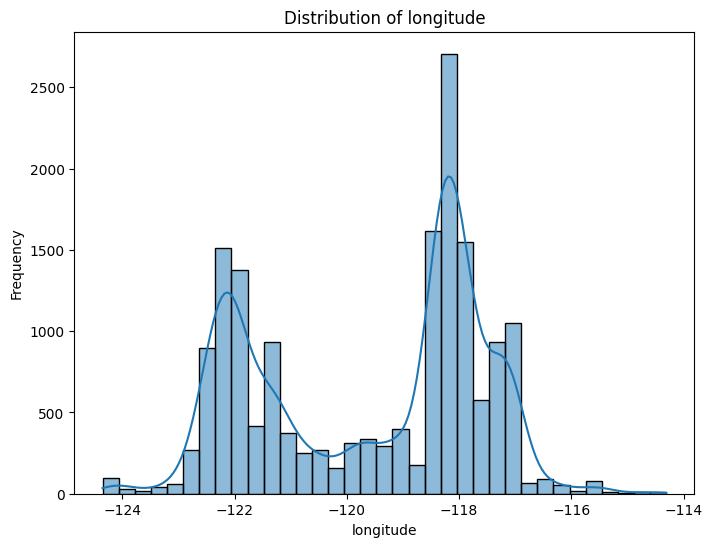

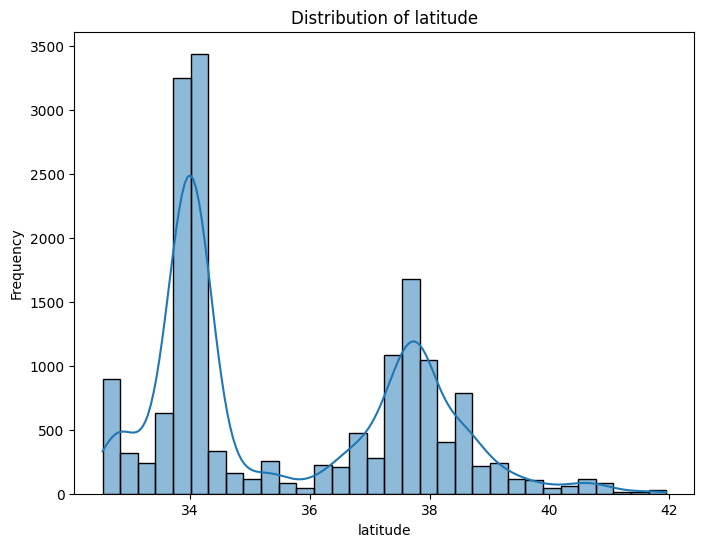

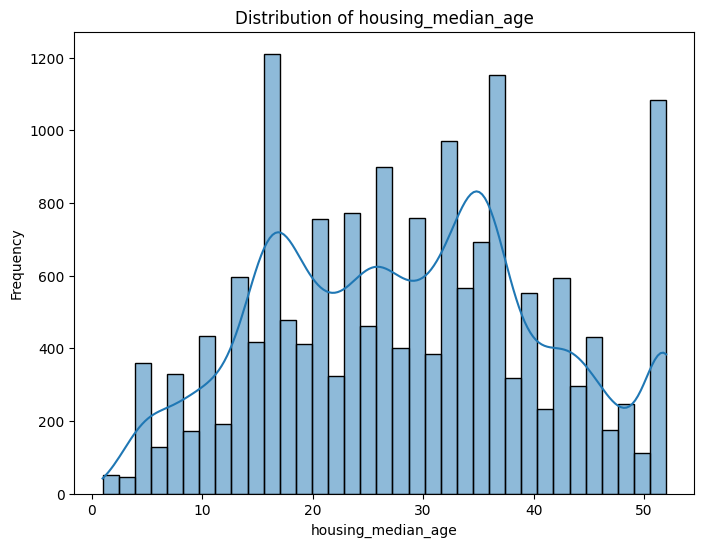

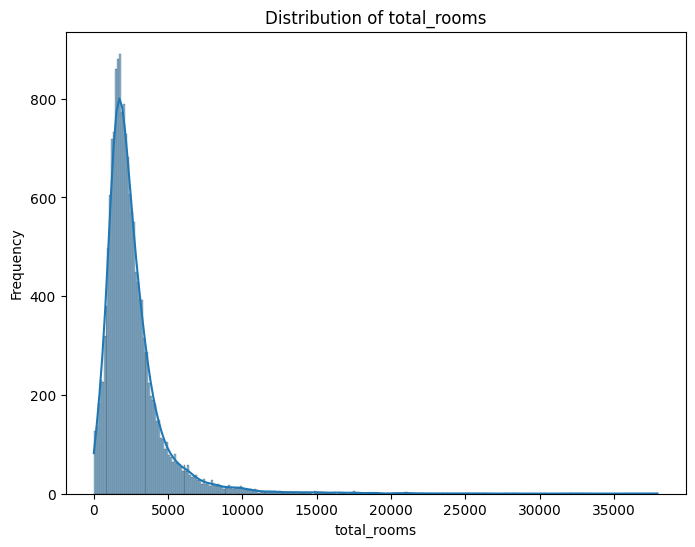

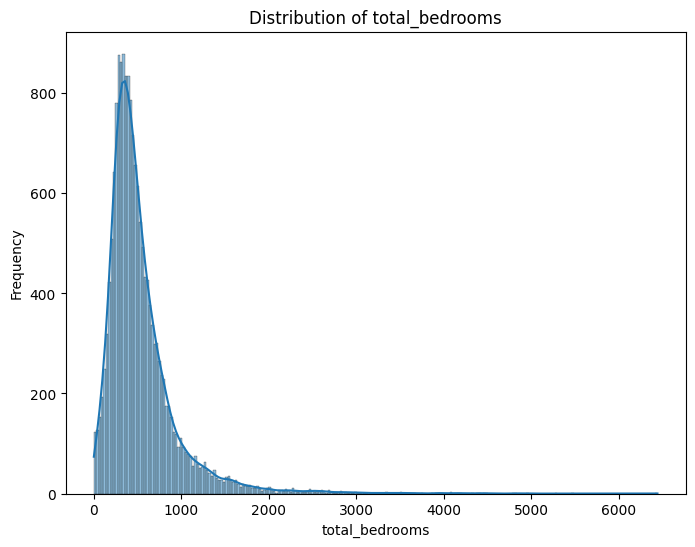

...

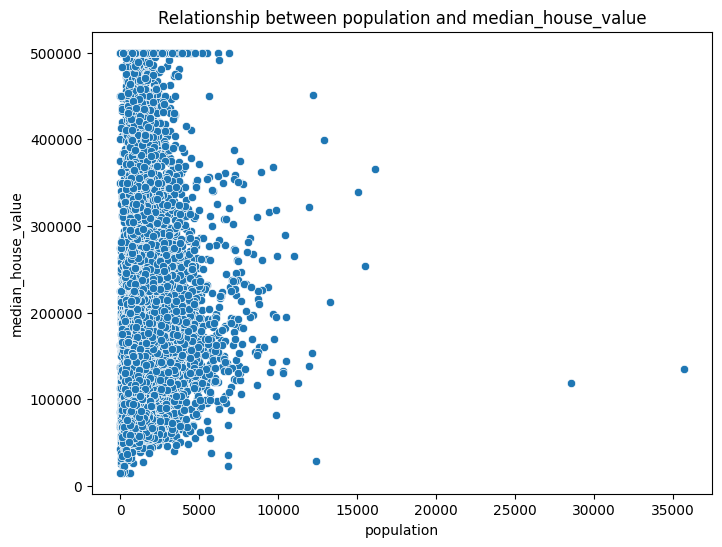

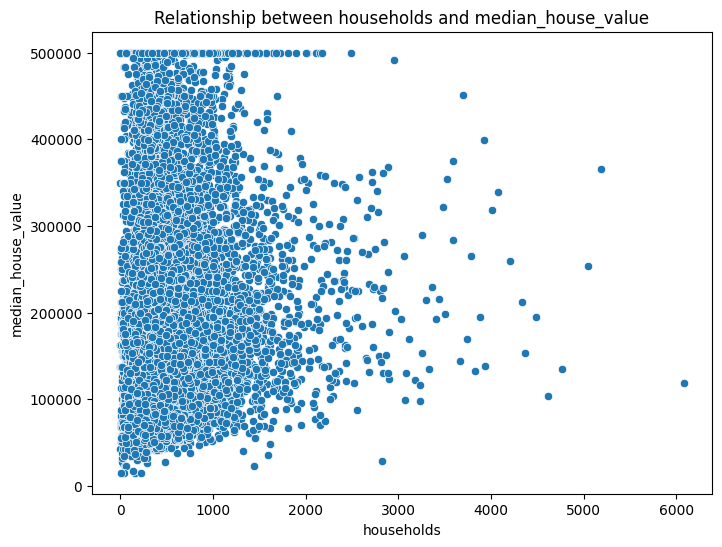

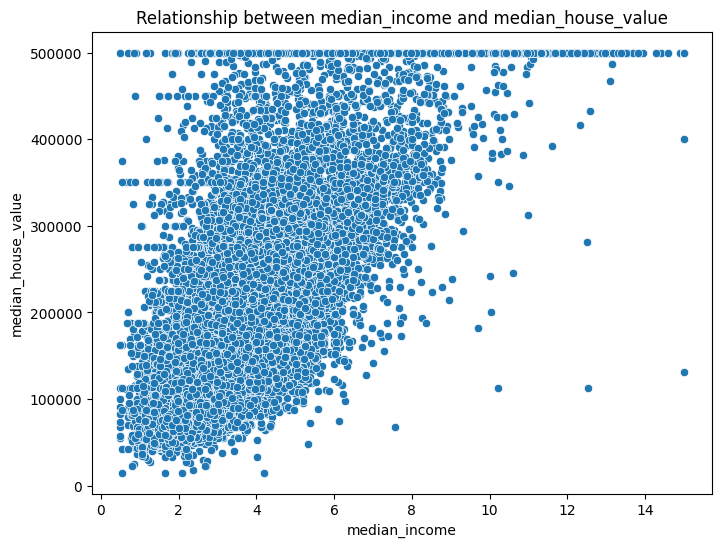

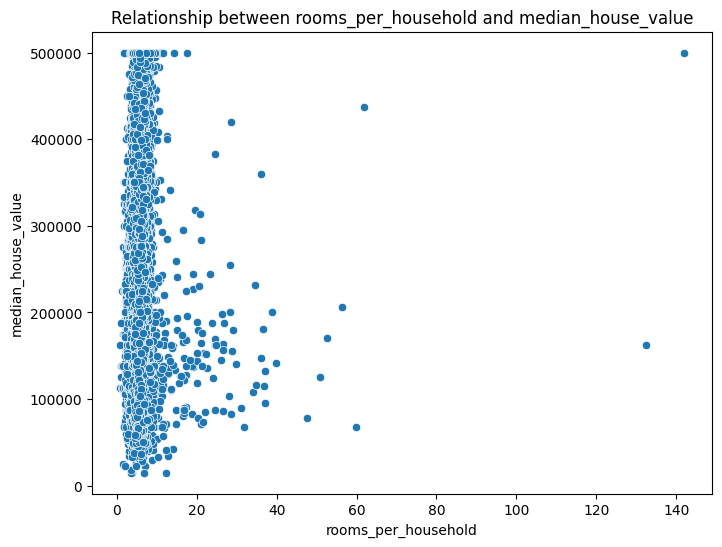

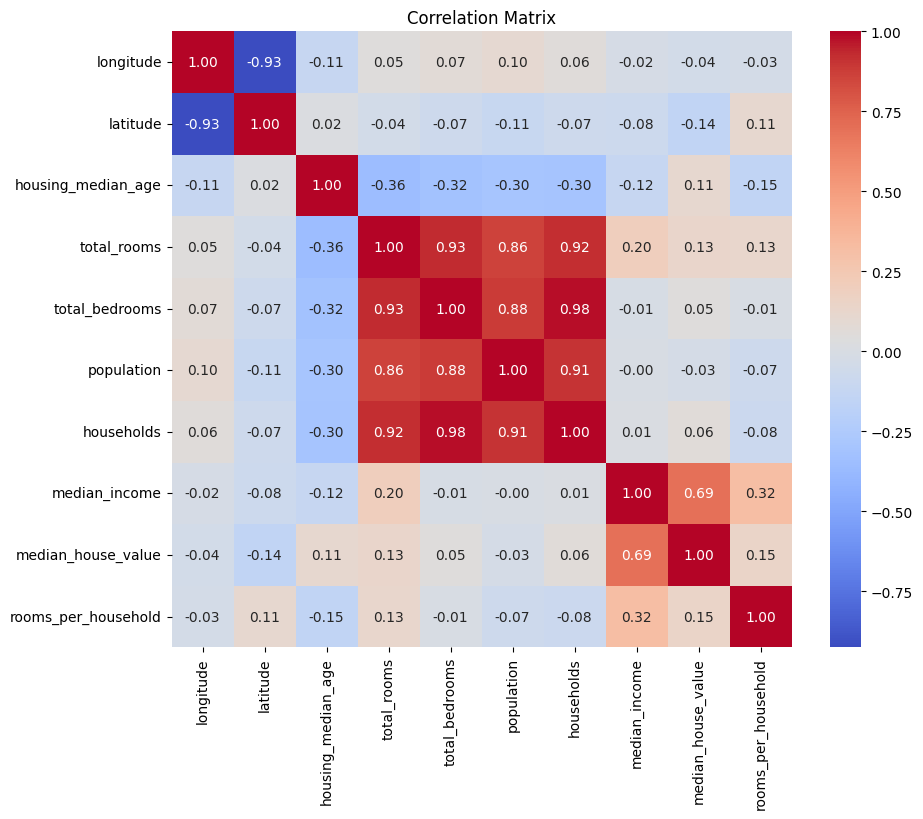

In [33]:
# Import necessary libraries for data manipulation and visualization
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Load the dataset into a pandas DataFrame
# Specify the file path to the training data
df = pd.read_csv('/content/sample_data/california_housing_train.csv')
# Display the first few rows of the DataFrame to verify successful loading
display(df.head())

# Check the shape of the DataFrame (number of rows and columns)
df.shape

# Check for duplicate rows in the DataFrame
df.duplicated().sum()

# Check for missing values in each column of the DataFrame
df.isnull().sum()

# Display concise summary of the DataFrame, including data types and non-null values
df.info()

# Generate descriptive statistics for numerical columns
df.describe()

# Feature Engineering: Create a new feature 'rooms_per_household'
# This is calculated by dividing the total number of rooms by the number of households
df['rooms_per_household'] = df['total_rooms'] / df['households']
# Display the first few rows with the new feature
display(df.head())

# Select numerical columns for visualization
numerical_cols = df.select_dtypes(include=np.number).columns

# Iterate through each numerical column to create a histogram
for col in numerical_cols:
    # Create a new figure for each plot
    plt.figure(figsize=(8, 6))
    # Generate a histogram with a Kernel Density Estimate (KDE) plot
    sns.histplot(df[col], kde=True)
    # Set the title of the plot
    plt.title(f'Distribution of {col}')
    # Set the label for the x-axis
    plt.xlabel(col)
    # Set the label for the y-axis
    plt.ylabel('Frequency')
    # Display the plot
    plt.show()

# Generate a pairplot to visualize pairwise relationships between all numerical features
sns.pairplot(df)
# Display the plot
plt.show()

# Select numerical columns and define the target variable
numerical_cols = df.select_dtypes(include=np.number).columns
target_col = 'median_house_value'

# Iterate through each numerical column to create a scatter plot against the target variable
for col in numerical_cols:
    # Exclude the target column itself from plotting against itself
    if col != target_col:
        # Create a new figure for each plot
        plt.figure(figsize=(8, 6))
        # Generate a scatter plot
        sns.scatterplot(data=df, x=col, y=target_col)
        # Set the title of the plot
        plt.title(f'Relationship between {col} and {target_col}')
        # Set the label for the x-axis
        plt.xlabel(col)
        # Set the label for the y-axis
        plt.ylabel(target_col)
        # Display the plot
        plt.show()

# Calculate the correlation matrix for all numerical columns
correlation_matrix = df.corr()
# Create a figure for the heatmap
plt.figure(figsize=(10, 8))
# Generate a heatmap of the correlation matrix
# annot=True displays the correlation values on the heatmap
# cmap='coolwarm' sets the color map
# fmt=".2f" formats the annotations to two decimal places
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
# Set the title of the heatmap
plt.title("Correlation Matrix")
# Display the heatmap
plt.show()